In [1]:
import os
import dataset
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
INPUT_DIR = '../data/CMAPSSData'
turbofan_data = dataset.TurbofanData(INPUT_DIR)
turbofan_data.preprocess(normalize=False)

Datasets FD_001, FD_002, FD_003, FD_004 are loaded succesfully!
Finish calculating RUL in FD_001.
Finish calculating RUL in FD_002.
Finish calculating RUL in FD_003.
Finish calculating RUL in FD_004.


In [3]:
# aggregate training datasets
to_concat = []
for i in range(4):
    dataset = 'FD_00{}'.format(i + 1)
    df = turbofan_data[dataset]['df_train'].copy()
    to_concat.append(df)

df = pd.concat(to_concat)

In [4]:
turbofan_data['FD_002']['df_train']

,unit_number,time,os_1,os_2,os_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_11,sensor_12,sensor_13,sensor_14,sensor_15,sensor_17,sensor_18,sensor_20,sensor_21,RUL
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,42.02,183.06,2387.72,8048.56,9.3461,334,2223,14.73,8.8071,148
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,42.20,130.42,2387.66,8072.30,9.3774,330,2212,10.41,6.2665,147
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,36.69,164.22,2028.03,7864.87,10.8941,309,1915,14.08,8.6723,146
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,41.96,130.72,2387.61,8068.66,9.3528,329,2212,10.59,6.4701,145
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,36.89,164.31,2028.00,7861.23,10.8963,309,1915,14.13,8.5286,144
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53754,260,312,20.0037,0.7000,100.0,491.19,608.79,1495.60,1269.51,9.35,...,44.72,314.05,2389.02,8169.64,9.3035,369,2324,24.36,14.5189,4
53755,260,313,10.0022,0.2510,100.0,489.05,605.81,1514.32,1324.12,10.52,...,46.08,371.22,2388.42,8245.36,8.7586,374,2319,28.10,16.9454,3
53756,260,314,25.0041,0.6200,60.0,462.54,537.48,1276.24,1057.92,7.05,...,37.14,163.74,2030.33,7971.25,11.0657,310,1915,14.19,8.5503,2
53757,260,315,25.0033,0.6220,60.0,462.54,537.84,1272.95,1066.30,7.05,...,37.32,164.37,2030.35,7972.47,11.0537,311,1915,14.05,8.3729,1


# Time Series Plots

In [ ]:
def custom_plt_plot(x, y, **kwargs):
    plt.plot(x, y, **kwargs)
    if 'markersize' in kwargs.keys():
        markersize = kwargs['markersize']
    else:
        markersize = None
    # plot first point
    plt.plot(x[0:1], y[0:1], 'o', color='red', alpha=0.2, markersize=markersize)
    # plot last point
    plt.plot(x[-2:-1], y[-2:-1], 'o', color='blue', alpha=0.2, markersize=markersize)


def plot_grouped_by_RUL(df, leg: bool = True, height: int = 2,
                        alpha: float = 0.05, markersize: int = None):
    cols = [col for col in df.columns if len(df[col].unique()) > 2]
    cols_data = [col for col in cols
                 if col.startswith('sen') or col.startswith('os')]
    color = {u: 'grey' for u in df['unit_number'].unique()}

    g = sns.PairGrid(data=df, x_vars="RUL", y_vars=cols_data, palette=color,
                     hue="unit_number", height=height, aspect=6)
    g = g.map(custom_plt_plot, markersize=markersize, alpha=alpha)
    g = g.set(xlim=(df['RUL'].max(), df['RUL'].min() - 10))
    if leg:
        g = g.add_legend()

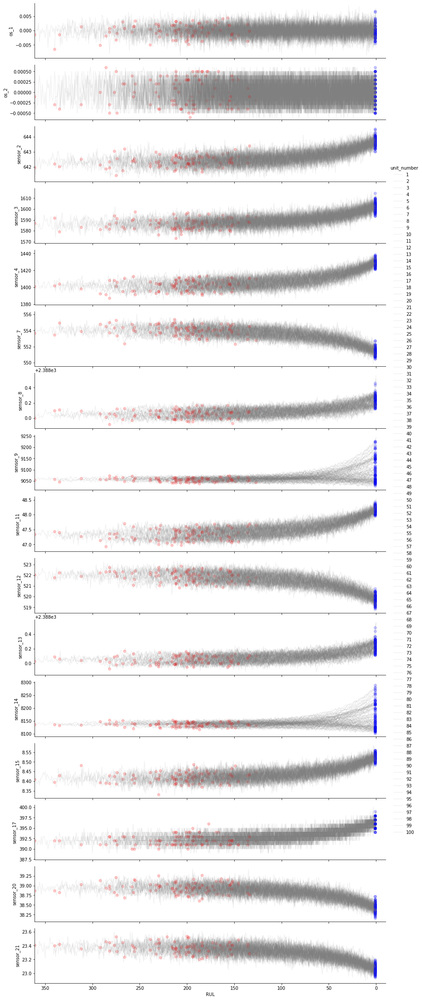

In [90]:
# FD_001
plot_grouped_by_RUL(turbofan_data['FD_001']['df_train'].copy(), alpha=0.1)

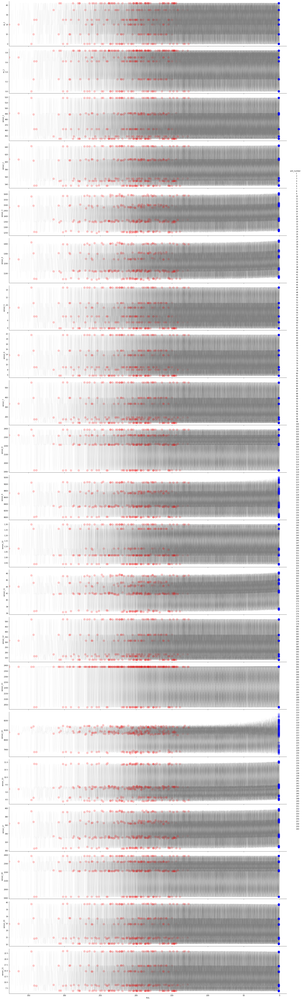

In [91]:
# FD_002
plot_grouped_by_RUL(turbofan_data['FD_002']['df_train'].copy(), height=4, markersize=12)

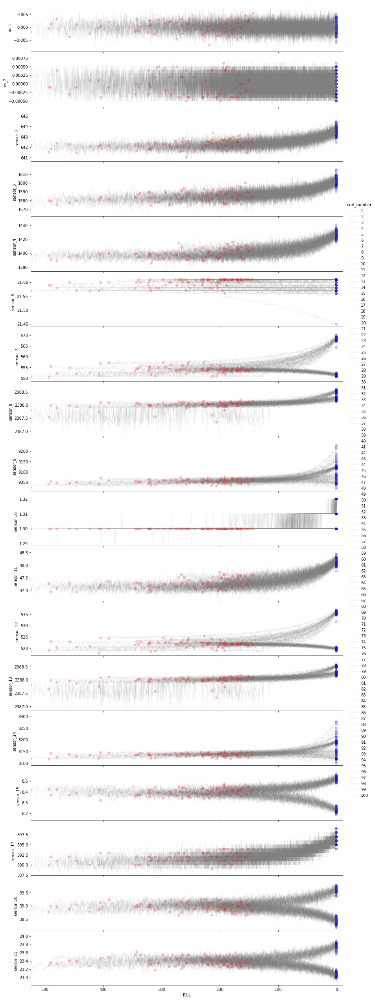

In [92]:
# FD_003
plot_grouped_by_RUL(turbofan_data['FD_003']['df_train'].copy(), alpha=0.1)

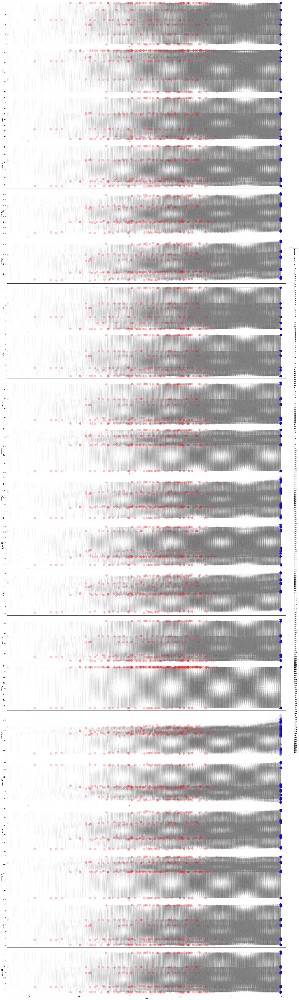

In [93]:
# FD_004
plot_grouped_by_RUL(turbofan_data['FD_004']['df_train'].copy(), height=5, markersize=16)

# 2D Plots

In [87]:
def plot_2d(data, name: str, unit_num: int, x: str, y: str):
    # group training data set by unit number
    grps = data[name]['df_train'].groupby(by='unit_number')
    df = grps.get_group(unit_num).copy()

    fig, ax = plt.subplots(figsize=(30,30))
    ax.plot(df[x], df[y], alpha=0.2)
    # label each data point
    for i in range(len(df)):
        ax.annotate(f"{df['RUL'].iloc[i]}",
                    xy=(df[x].iloc[i],df[y].iloc[i]),
                    textcoords='data')

    title = f'{name} unit {unit_num}: {y} vs {x}'
    ax.set_title(title)
    ax.set(xlabel=x, ylabel=y)

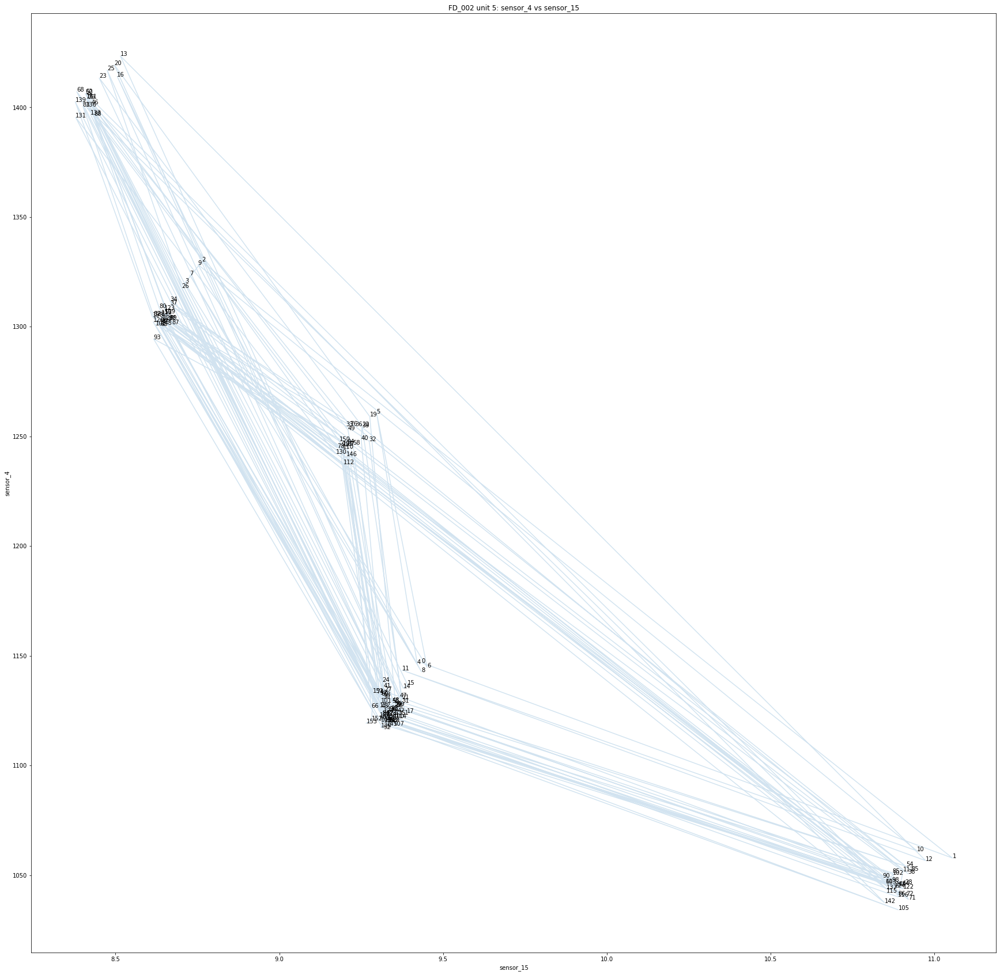

In [90]:
# plot_2d(turbofan_data, 'FD_002', 4, 'sensor_15', 'sensor_14')
# plot_2d(turbofan_data, 'FD_002', 7, 'sensor_15', 'sensor_14')
plot_2d(turbofan_data, 'FD_002', 5, 'sensor_15', 'sensor_4')


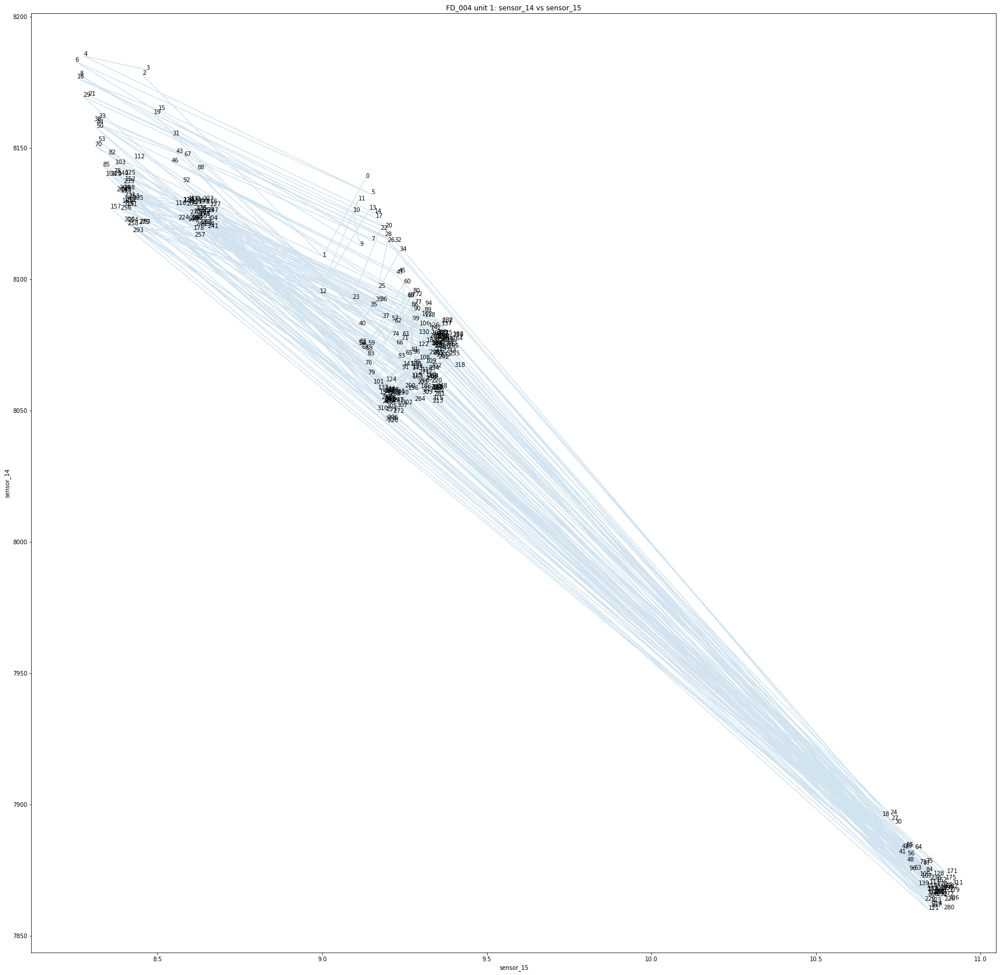

In [98]:
plot_2d(turbofan_data, 'FD_004', 1, 'sensor_15', 'sensor_14')
# plot_2d(turbofan_data, 'FD_004', 7, 'sensor_15', 'sensor_4')
